In [1]:
import pandas as pd
from pandas import read_excel

In [2]:
data = pd.read_csv("C:\\Users\\LENOVO\\Downloads\\Digilog_panel_EN.csv", encoding="latin1")
data

,lfdn,duration,v_10,v_11,v_12,v_14,v_15,v_16,v_17,v_18,...,F45_W3,F46_W3,F47_W3,F48_1_W3,F48_2_W3,F48_3_W3,F48_4_W3,F49_1_W3,F49_2_W3,F49_3_W3
0,70,1458,1,73,5,2,1,8,1,6,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,72,1140,1,51,4,3,1,5,3,2,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,73,2402,1,70,5,1,1,3,5,6,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,74,1084,2,57,4,3,1,6,2,6,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,75,946,2,52,4,2,1,12,4,8,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3259,6402,1256,2,28,1,1,1,14,3,7,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3260,6409,745,1,47,3,1,1,5,3,6,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3261,6411,3296,1,47,3,1,1,9,2,5,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3262,6437,1022,2,19,1,1,1,3,3,6,...,4.0,10.0,5.0,2.0,1.0,3.0,1.0,5.0,2.0,1.0


In [3]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3264 entries, 0 to 3263
Columns: 638 entries, lfdn to F49_3_W3
dtypes: float64(461), int64(175), object(2)
memory usage: 15.9+ MB


In [4]:
data.columns

Index(['lfdn', 'duration', 'v_10', 'v_11', 'v_12', 'v_14', 'v_15', 'v_16',
       'v_17', 'v_18',
       ...
       'F45_W3', 'F46_W3', 'F47_W3', 'F48_1_W3', 'F48_2_W3', 'F48_3_W3',
       'F48_4_W3', 'F49_1_W3', 'F49_2_W3', 'F49_3_W3'],
      dtype='object', length=638)

In [5]:
print(data.head())

   lfdn  duration  v_10  v_11  v_12  v_14  v_15  v_16  v_17  v_18  ...  \
0    70      1458     1    73     5     2     1     8     1     6  ...   
1    72      1140     1    51     4     3     1     5     3     2  ...   
2    73      2402     1    70     5     1     1     3     5     6  ...   
3    74      1084     2    57     4     3     1     6     2     6  ...   
4    75       946     2    52     4     2     1    12     4     8  ...   

   F45_W3  F46_W3  F47_W3  F48_1_W3  F48_2_W3  F48_3_W3  F48_4_W3  F49_1_W3  \
0     NaN     NaN     NaN       NaN       NaN       NaN       NaN       NaN   
1     NaN     NaN     NaN       NaN       NaN       NaN       NaN       NaN   
2     NaN     NaN     NaN       NaN       NaN       NaN       NaN       NaN   
3     NaN     NaN     NaN       NaN       NaN       NaN       NaN       NaN   
4     NaN     NaN     NaN       NaN       NaN       NaN       NaN       NaN   

   F49_2_W3  F49_3_W3  
0       NaN       NaN  
1       NaN       NaN  
2       

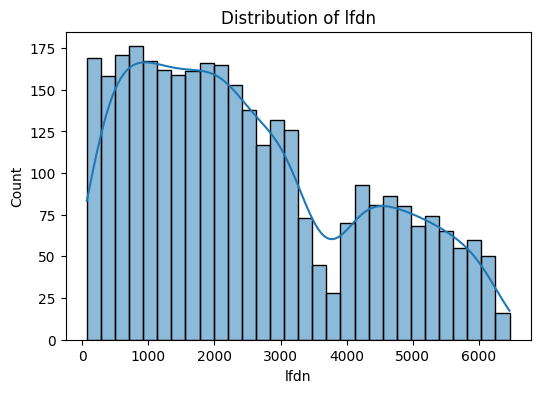

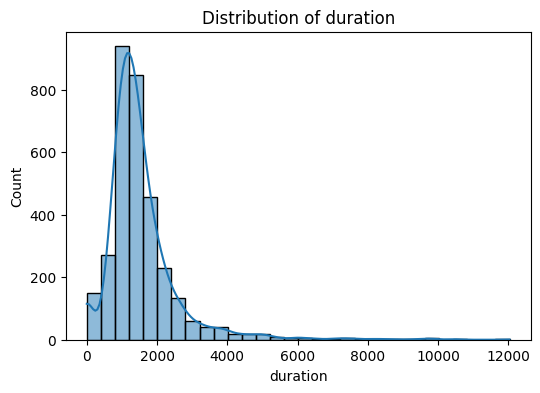

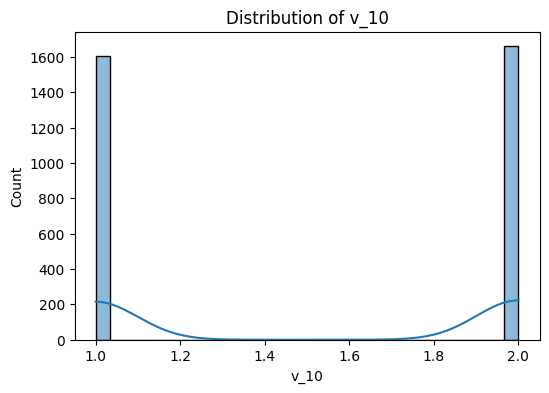

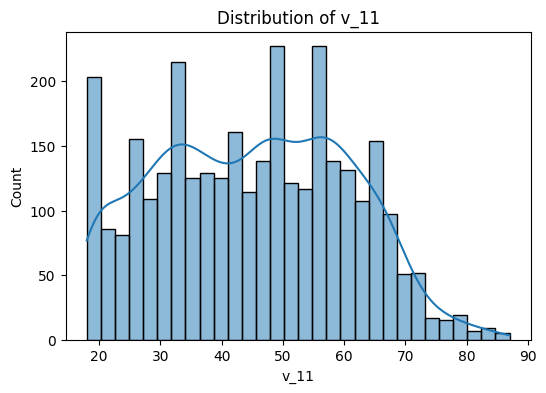

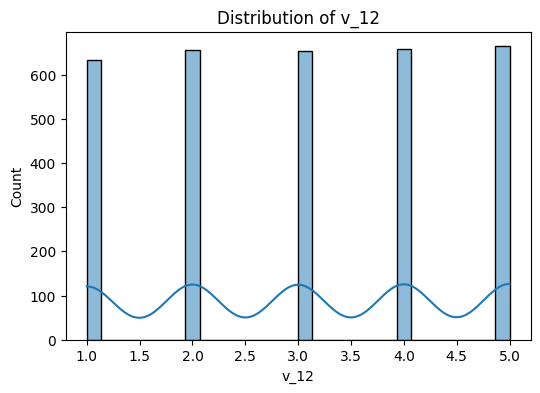

...

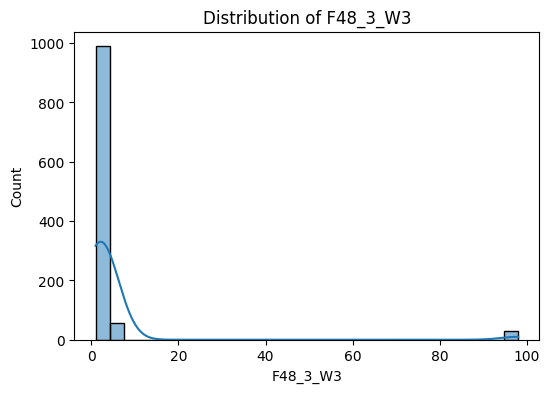

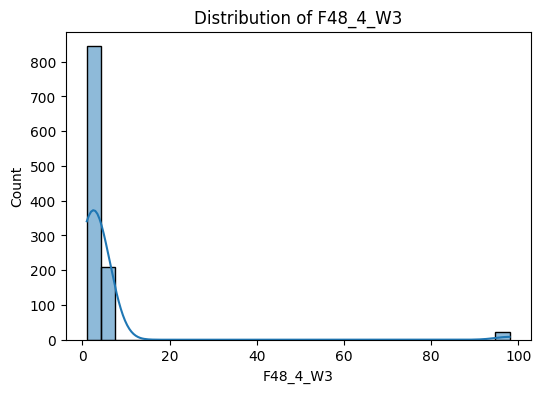

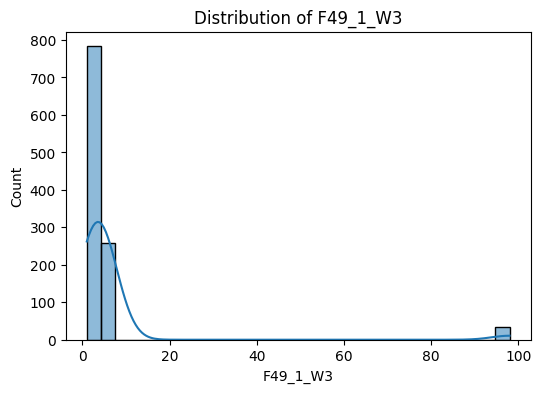

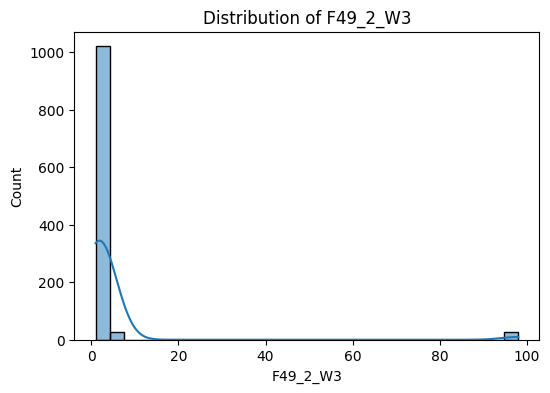

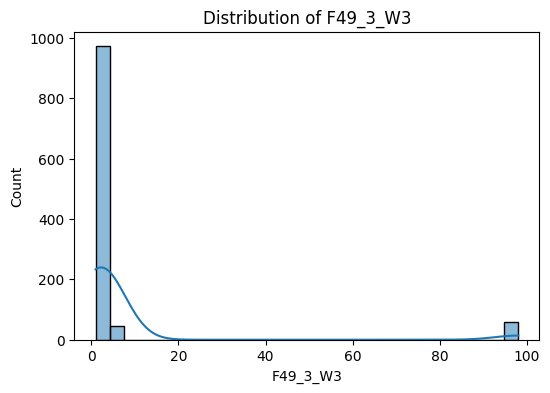

In [6]:
import seaborn as sns
import matplotlib.pyplot as plt

num_cols = data.select_dtypes(include=['float64', 'int64']).columns

for col in num_cols:
    plt.figure(figsize=(6,4))
    sns.histplot(data[col], kde=True, bins=30)
    plt.title(f'Distribution of {col}')
    plt.show()


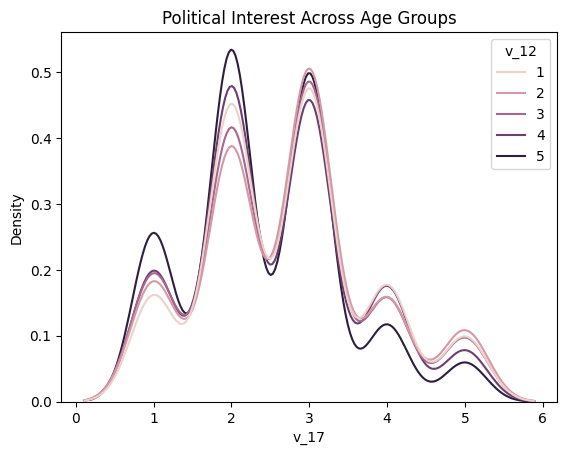

In [7]:
# Example: Compare political interest across age groups
import seaborn as sns
sns.kdeplot(data=data, x="v_17", hue="v_12", common_norm=False)  # v_12 = age group
plt.title("Political Interest Across Age Groups")
plt.show()

In [8]:
from scipy.stats import ks_2samp

# Compare satisfaction with democracy (v_19) between two age groups
group_1 = data[data["v_12"] == 1]["v_19"]  # Age 18-29
group_2 = data[data["v_12"] == 5]["v_19"]  # Age 60+

stat, p_value = ks_2samp(group_1, group_2)
print(f'KS Test Statistic: {stat}, P-value: {p_value}')

if p_value < 0.05:
    print("The distributions are significantly different (non-IID).")
else:
    print("No significant difference detected (IID).")

KS Test Statistic: 0.026590589487286685, P-value: 0.9692335121747689
No significant difference detected (IID).


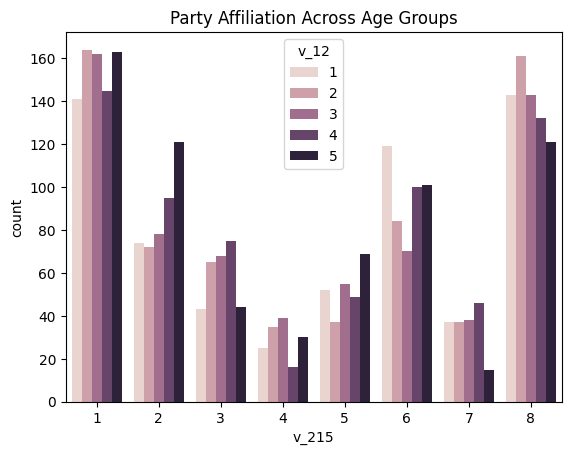

In [9]:
sns.countplot(data=data, x='v_215', hue='v_12')
plt.title("Party Affiliation Across Age Groups")
plt.show()


In [10]:
w1 = data[data.columns[data.columns.str.contains('W') == False]]
w1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3264 entries, 0 to 3263
Columns: 210 entries, lfdn to v_215
dtypes: float64(33), int64(175), object(2)
memory usage: 5.2+ MB


In [11]:
w1

,lfdn,duration,v_10,v_11,v_12,v_14,v_15,v_16,v_17,v_18,...,v_206,v_207,v_208,v_209,v_210,v_211,v_212,v_213,v_214,v_215
0,70,1458,1,73,5,2,1,8,1,6,...,5,1,1,5,5,3,2,10,1,8
1,72,1140,1,51,4,3,1,5,3,2,...,1,2,2,5,2,1,3,1,4,2
2,73,2402,1,70,5,1,1,3,5,6,...,1,3,1,4,1,2,1,10,4,2
3,74,1084,2,57,4,3,1,6,2,6,...,1,1,2,5,5,3,3,1,1,6
4,75,946,2,52,4,2,1,12,4,8,...,98,98,3,5,4,3,3,1,3,8
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3259,6402,1256,2,28,1,1,1,14,3,7,...,98,1,2,98,4,98,2,2,1,7
3260,6409,745,1,47,3,1,1,5,3,6,...,1,1,1,4,4,1,2,10,3,8
3261,6411,3296,1,47,3,1,1,9,2,5,...,1,1,2,5,5,4,3,6,1,6
3262,6437,1022,2,19,1,1,1,3,3,6,...,1,1,98,98,5,98,1,4,3,6


In [12]:
w1.columns.values

array(['lfdn', 'duration', 'v_10', 'v_11', 'v_12', 'v_14', 'v_15', 'v_16',
       'v_17', 'v_18', 'v_19', 'v_21', 'v_23', 'v_24', 'v_25', 'v_26',
       'v_27', 'v_28', 'v_29', 'v_30', 'v_31', 'v_32', 'v_33', 'v_34',
       'v_35', 'v_36', 'v_37', 'v_38', 'v_39', 'v_40', 'v_41', 'v_42',
       'v_43', 'v_44', 'v_45_1', 'v_45_2', 'v_45_3', 'v_45_4', 'v_45_5',
       'v_45_6', 'v_45_7', 'v_45_8', 'v_45_9', 'v_45_10', 'v_45_11',
       'v_45_12', 'v_46', 'v_47', 'v_48', 'v_49', 'v_50', 'v_51', 'v_52',
       'v_53', 'v_54', 'v_55', 'v_56', 'v_57', 'v_58', 'v_59', 'v_60',
       'v_61', 'v_62', 'v_63', 'v_64', 'v_65', 'v_66', 'v_67', 'v_68',
       'v_69', 'v_70', 'v_71', 'v_72', 'v_73', 'v_74', 'v_75', 'v_76',
       'v_77', 'v_78', 'v_79', 'v_80', 'v_81', 'v_82', 'v_83', 'v_84',
       'v_85', 'v_86', 'v_87', 'v_88', 'v_89', 'v_91', 'v_92', 'v_94',
       'v_95', 'v_96', 'v_98', 'v_99', 'v_100', 'v_101', 'v_102', 'v_103',
       'v_104', 'v_105', 'v_106', 'v_107', 'v_108', 'v_109', 'v_11

In [13]:
from scipy.stats import ks_2samp
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.impute import SimpleImputer
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline

In [14]:
missing_analysis = w1.isnull().sum()
missing_percentages = (missing_analysis / len(w1)) * 100
# Columns with missing data
columns_with_missing = missing_percentages[missing_percentages > 0]
print("Columns with Missing Data:")
print(columns_with_missing)

Columns with Missing Data:
v_45_1     71.384804
v_45_2     85.876225
v_45_3     64.522059
v_45_4     96.354167
v_45_5     68.627451
v_45_6     65.410539
v_45_7     82.659314
v_45_8     36.090686
v_45_9     78.860294
v_45_10    79.381127
v_45_11    93.106618
v_45_12    83.026961
v_100      14.552696
v_101      14.552696
v_102      14.552696
v_103      14.552696
v_104      14.552696
v_105      14.552696
v_106      14.552696
v_107      14.552696
v_108      14.552696
v_109      14.552696
v_110      14.552696
v_220       1.593137
v_185      40.379902
v_186      40.379902
v_187      40.379902
v_188      40.379902
v_190      77.665441
v_191      77.665441
v_192      77.665441
v_193      77.665441
dtype: float64


In [15]:
new_w1 = w1.drop(columns=['v_45_1', 'v_45_2', 'v_45_3', 'v_45_4', 'v_45_5', 'v_45_6', 'v_45_7', 'v_45_8', 'v_45_9', 'v_45_10', 'v_45_11', 'v_45_12', 'v_190', 'v_191', 'v_192', 'v_193'])

In [16]:
new_w1.columns.values

array(['lfdn', 'duration', 'v_10', 'v_11', 'v_12', 'v_14', 'v_15', 'v_16',
       'v_17', 'v_18', 'v_19', 'v_21', 'v_23', 'v_24', 'v_25', 'v_26',
       'v_27', 'v_28', 'v_29', 'v_30', 'v_31', 'v_32', 'v_33', 'v_34',
       'v_35', 'v_36', 'v_37', 'v_38', 'v_39', 'v_40', 'v_41', 'v_42',
       'v_43', 'v_44', 'v_46', 'v_47', 'v_48', 'v_49', 'v_50', 'v_51',
       'v_52', 'v_53', 'v_54', 'v_55', 'v_56', 'v_57', 'v_58', 'v_59',
       'v_60', 'v_61', 'v_62', 'v_63', 'v_64', 'v_65', 'v_66', 'v_67',
       'v_68', 'v_69', 'v_70', 'v_71', 'v_72', 'v_73', 'v_74', 'v_75',
       'v_76', 'v_77', 'v_78', 'v_79', 'v_80', 'v_81', 'v_82', 'v_83',
       'v_84', 'v_85', 'v_86', 'v_87', 'v_88', 'v_89', 'v_91', 'v_92',
       'v_94', 'v_95', 'v_96', 'v_98', 'v_99', 'v_100', 'v_101', 'v_102',
       'v_103', 'v_104', 'v_105', 'v_106', 'v_107', 'v_108', 'v_109',
       'v_110', 'v_111', 'v_112', 'v_113', 'v_114', 'v_115', 'v_116',
       'v_117', 'v_118', 'v_119', 'v_120', 'v_121', 'v_122', 'v_123',
  

In [17]:
new_w1

,lfdn,duration,v_10,v_11,v_12,v_14,v_15,v_16,v_17,v_18,...,v_206,v_207,v_208,v_209,v_210,v_211,v_212,v_213,v_214,v_215
0,70,1458,1,73,5,2,1,8,1,6,...,5,1,1,5,5,3,2,10,1,8
1,72,1140,1,51,4,3,1,5,3,2,...,1,2,2,5,2,1,3,1,4,2
2,73,2402,1,70,5,1,1,3,5,6,...,1,3,1,4,1,2,1,10,4,2
3,74,1084,2,57,4,3,1,6,2,6,...,1,1,2,5,5,3,3,1,1,6
4,75,946,2,52,4,2,1,12,4,8,...,98,98,3,5,4,3,3,1,3,8
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3259,6402,1256,2,28,1,1,1,14,3,7,...,98,1,2,98,4,98,2,2,1,7
3260,6409,745,1,47,3,1,1,5,3,6,...,1,1,1,4,4,1,2,10,3,8
3261,6411,3296,1,47,3,1,1,9,2,5,...,1,1,2,5,5,4,3,6,1,6
3262,6437,1022,2,19,1,1,1,3,3,6,...,1,1,98,98,5,98,1,4,3,6


In [18]:
new_w1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3264 entries, 0 to 3263
Columns: 194 entries, lfdn to v_215
dtypes: float64(17), int64(175), object(2)
memory usage: 4.8+ MB


In [19]:
object_columns = new_w1.select_dtypes(include=['object']).columns
object_columns

Index(['v_189', 'v_194'], dtype='object')

In [20]:
new_w1 = new_w1.drop(columns=['v_189', 'v_194'])

In [21]:
new_w1

,lfdn,duration,v_10,v_11,v_12,v_14,v_15,v_16,v_17,v_18,...,v_206,v_207,v_208,v_209,v_210,v_211,v_212,v_213,v_214,v_215
0,70,1458,1,73,5,2,1,8,1,6,...,5,1,1,5,5,3,2,10,1,8
1,72,1140,1,51,4,3,1,5,3,2,...,1,2,2,5,2,1,3,1,4,2
2,73,2402,1,70,5,1,1,3,5,6,...,1,3,1,4,1,2,1,10,4,2
3,74,1084,2,57,4,3,1,6,2,6,...,1,1,2,5,5,3,3,1,1,6
4,75,946,2,52,4,2,1,12,4,8,...,98,98,3,5,4,3,3,1,3,8
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3259,6402,1256,2,28,1,1,1,14,3,7,...,98,1,2,98,4,98,2,2,1,7
3260,6409,745,1,47,3,1,1,5,3,6,...,1,1,1,4,4,1,2,10,3,8
3261,6411,3296,1,47,3,1,1,9,2,5,...,1,1,2,5,5,4,3,6,1,6
3262,6437,1022,2,19,1,1,1,3,3,6,...,1,1,98,98,5,98,1,4,3,6


In [22]:
import flwr as fl
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
import torch

In [23]:
import numpy as np
import causallearn
from torch import nn, optim
from torch.utils.data import DataLoader, TensorDataset
from causallearn.search.ConstraintBased.PC import pc
from causallearn.search.ConstraintBased.FCI import fci
from causallearn.utils.GraphUtils import GraphUtils
import networkx as nx
import matplotlib.pyplot as plt

In [24]:
# Shuffle dataset
data = data.sample(frac=1, random_state=42).reset_index(drop=True)

# Split into 50 clients
num_clients = 50
client_data = np.array_split(new_w1, num_clients)
# Save each client's data
for i, df in enumerate(client_data):
    df.to_csv(f"client_{i+1}.csv", index=False)

print("Data successfully divided into 50 clients.")

c:\Users\LENOVO\AppData\Local\Programs\Python\Python311\Lib\site-packages\numpy\core\fromnumeric.py:59: FutureWarning: 'DataFrame.swapaxes' is deprecated and will be removed in a future version. Please use 'DataFrame.transpose' instead.
  return bound(*args, **kwds)


Data successfully divided into 50 clients.


In [25]:
import torchvision

In [26]:
covid_columns = ["v_96", "v_144", "v_145", "v_146", "v_147", "v_148", "v_150", "v_174", "v_175", "v_176", "v_212", "v_155", "v_156", "v_157", "v_158", "v_159", "v_160","v_161","v_162"]
general_columns = ["v_10","v_12", "v_16", "v_17"]
political_columns = ["v_46", "v_47", "v_49", "v_50", "v_51","v_52", "v_53", "v_54", "v_55", "v_56", "v_183", "v_181", "v_179", "v_122"]

In [27]:
selected_columns = covid_columns + general_columns + political_columns
new_w1_selected = new_w1[selected_columns].dropna()
X = new_w1_selected.values

  0%|          | 0/37 [00:00<?, ?it/s]

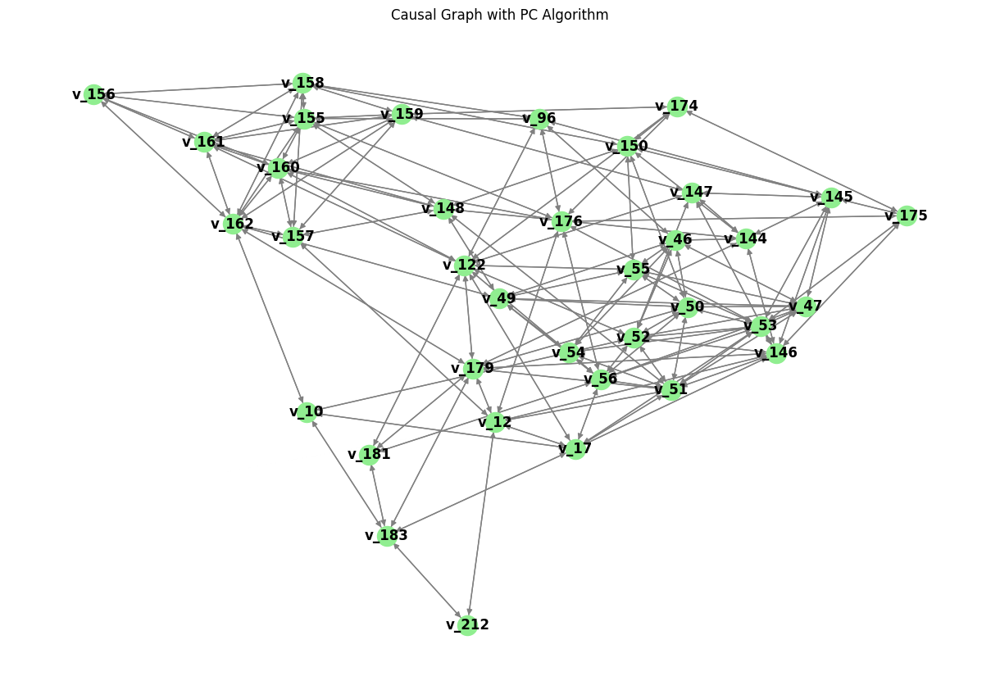

In [28]:
#run causal discovery algorithm
cg = pc(X)

# Create NetworkX graph manually
graph = nx.DiGraph()

# Add edges from the learned graph
for i in range(len(cg.G.graph)):
    for j in range(len(cg.G.graph)):
        if cg.G.graph[i][j] != 0:
            graph.add_edge(i, j)

#renaming columns to original columns names
mapping = {i: col for i, col in enumerate(new_w1_selected.columns)}
graph = nx.relabel_nodes(graph, mapping)

# Visualize
plt.figure(figsize=(12, 8))
nx.draw(graph, with_labels=True, node_color="lightgreen", font_weight='bold', edge_color="gray")
plt.title("Causal Graph with PC Algorithm")
plt.show()


  0%|          | 0/8 [00:00<?, ?it/s]

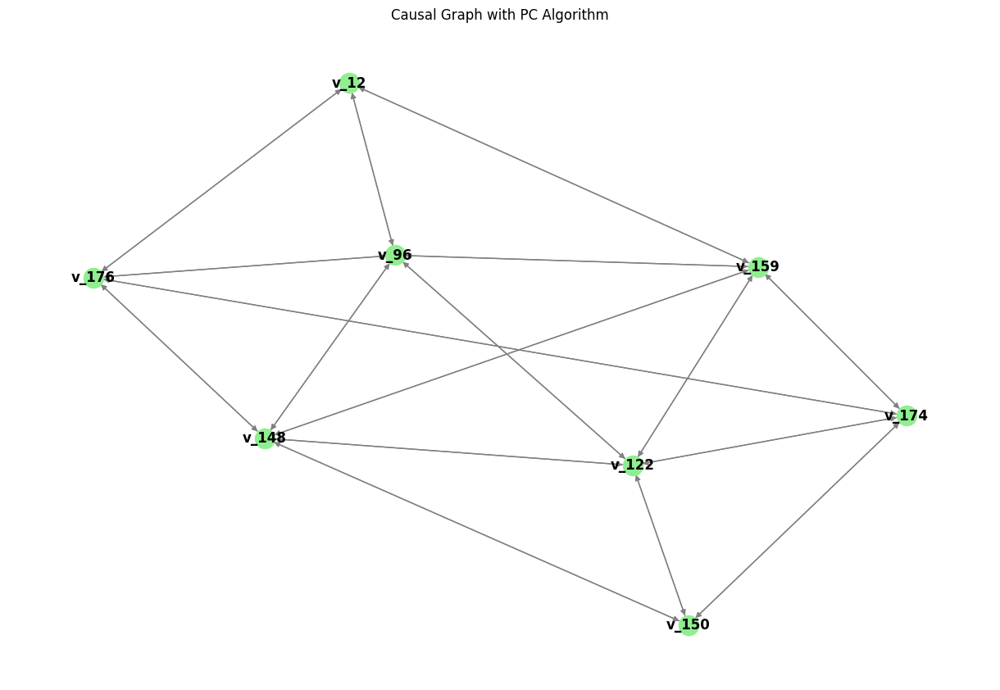

In [29]:
new_selected_columns = ["v_176", "v_159", "v_12", "v_148", "v_122", "v_150", "v_96", "v_174"]

new_w1_selected = new_w1[new_selected_columns].fillna(-1)
X = new_w1_selected.values

#second run of pc algorihtm with new selected columns
cg = pc(X)

# Create NetworkX graph manually
graph = nx.DiGraph()

# Add edges from the learned graph
for i in range(len(cg.G.graph)):
    for j in range(len(cg.G.graph)):
        if cg.G.graph[i][j] != 0:
            graph.add_edge(i, j)

#renaming columns to original columns names
mapping = {i: col for i, col in enumerate(new_w1_selected.columns)}
graph = nx.relabel_nodes(graph, mapping)

# Visualize
plt.figure(figsize=(12, 8))
nx.draw(graph, with_labels=True, node_color="lightgreen", font_weight='bold', edge_color="gray")
plt.title("Causal Graph with PC Algorithm")
plt.show()

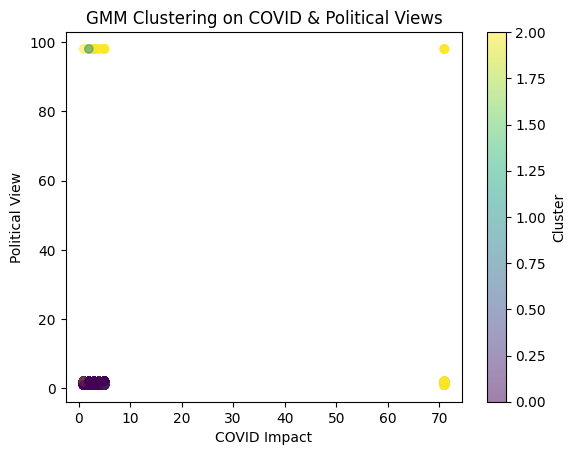

In [30]:
from sklearn.mixture import GaussianMixture
new_selected_columns = ["v_176", "v_159", "v_12", "v_148", "v_122", "v_150", "v_96", "v_174"]
new_w1_selected = new_w1[new_selected_columns].dropna()
X = new_w1_selected.values

# Fit Gaussian Mixture Model
gmm = GaussianMixture(n_components=3, covariance_type="full", random_state=42)
gmm.fit(X)

# Predict clusters
data["cluster"] = gmm.predict(X)

# Visualize Clusters
plt.scatter(X[:, 0], X[:, 1], c=data["cluster"], cmap="viridis", alpha=0.5)
plt.xlabel("COVID Impact")
plt.ylabel("Political View")
plt.title("GMM Clustering on COVID & Political Views")
plt.colorbar(label="Cluster")
plt.show()

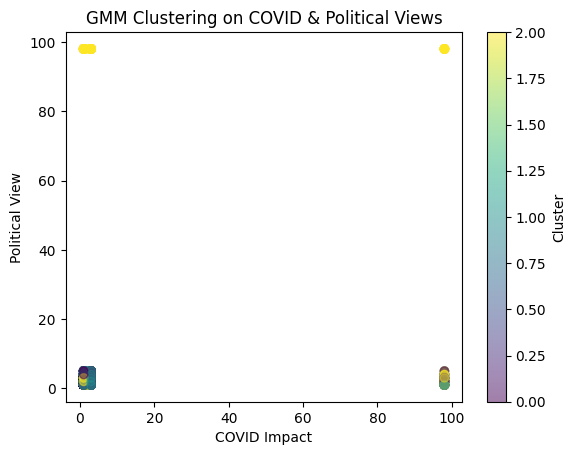

In [31]:
selected_columns = covid_columns + general_columns + political_columns
new_w1_selected = new_w1[selected_columns].dropna()
X = new_w1_selected.values

# Fit Gaussian Mixture Model
gmm = GaussianMixture(n_components=3, covariance_type="full", random_state=42)
gmm.fit(X)

# Predict clusters
data["cluster"] = gmm.predict(X)

# Visualize Clusters
plt.scatter(X[:, 0], X[:, 1], c=data["cluster"], cmap="viridis", alpha=0.5)
plt.xlabel("COVID Impact")
plt.ylabel("Political View")
plt.title("GMM Clustering on COVID & Political Views")
plt.colorbar(label="Cluster")
plt.show()

In [32]:
new_selected_columns = ["v_176", "v_159", "v_12", "v_148", "v_122", "v_150", "v_96", "v_174"]
new_w1_selected = new_w1[new_selected_columns].dropna()
X = new_w1_selected.values
# Create a DataFrame with cluster labels
clustered_data = pd.DataFrame(X, columns=new_selected_columns)
clustered_data["Cluster"] = data["cluster"]

# Compute mean and variance for each cluster
cluster_stats = clustered_data.groupby("Cluster").agg(["mean", "var"])
print(cluster_stats)

             v_176                  v_159                  v_12            \
              mean         var       mean         var      mean       var   
Cluster                                                                     
0         4.310062   94.592355   1.649897    0.227765  3.065708  1.997733   
1         2.866966    1.412502   1.642252    0.229879  3.073244  1.947275   
2        14.604240  653.083954  12.883392  959.911886  2.477032  1.995038   

             v_148                   v_122                   v_150  \
              mean          var       mean          var       mean   
Cluster                                                              
0         3.378850     1.773077  10.808008   467.411200   4.335729   
1         3.166418     1.975282   5.611360     3.746192   4.204285   
2        25.491166  1606.165702  21.805654  1224.256422  27.756184   

                           v_96                  v_174              
                 var       mean          var   

In [33]:
print(f"Original shape of new_w1_selected: {new_w1_selected.shape}")  # Should be (3264, 8)
print(f"Shape of X after transformations: {X.shape}")  # Expected (3264, 8) but is (3264, 37)

Original shape of new_w1_selected: (3264, 8)
Shape of X after transformations: (3264, 8)


In [34]:
print(new_w1_selected.dtypes)


v_176    int64
v_159    int64
v_12     int64
v_148    int64
v_122    int64
v_150    int64
v_96     int64
v_174    int64
dtype: object


In [35]:
print(new_w1_selected.nunique())  # See number of unique values per column


v_176     6
v_159     3
v_12      5
v_148     6
v_122    12
v_150     6
v_96      4
v_174     6
dtype: int64


In [36]:
print("Columns in X:", X.shape[1])
print("Expected columns:", len(new_selected_columns))


Columns in X: 8
Expected columns: 8


In [37]:
demographics = new_w1[general_columns]
demographics = demographics.loc[new_w1_selected.index]  # Ensure indices match after NaN removal

# Add demographics to clustered data
clustered_data = clustered_data.join(demographics)

# Check distributions across clusters
for col in general_columns:
    print(f"Distribution of {col} by cluster:")
    print(clustered_data.groupby("Cluster")[col].value_counts(normalize=True))
    print("\n")

ValueError: columns overlap but no suffix specified: Index(['v_12'], dtype='object')

In [ ]:
!pip show flwr

Name: flwr
Version: 1.15.2
Summary: Flower: A Friendly Federated AI Framework
Home-page: https://flower.ai
Author: The Flower Authors
Author-email: hello@flower.ai
License: Apache-2.0
Location: C:\Users\LENOVO\AppData\Local\Programs\Python\Python311\Lib\site-packages
Requires: cryptography, grpcio, iterators, numpy, pathspec, protobuf, pycryptodome, pyyaml, requests, rich, tomli, tomli-w, typer
Required-by: 


In [38]:
cg.G.graph

array([[ 0,  0,  1,  1,  0,  0, -1,  1],
       [ 0,  0,  1,  1,  1,  0,  1,  1],
       [-1, -1,  0,  0,  0,  0, -1,  0],
       [-1, -1,  0,  0, -1, -1, -1,  0],
       [ 0, -1,  0,  1,  0,  1,  1,  1],
       [ 0,  0,  0, -1, -1,  0,  0, -1],
       [ 1, -1,  1,  1, -1,  0,  0,  0],
       [-1, -1,  0,  0, -1, -1,  0,  0]])

In [39]:
new_w1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3264 entries, 0 to 3263
Columns: 192 entries, lfdn to v_215
dtypes: float64(17), int64(175)
memory usage: 4.8 MB


In [40]:
new_w1.fillna(-1)

,lfdn,duration,v_10,v_11,v_12,v_14,v_15,v_16,v_17,v_18,...,v_206,v_207,v_208,v_209,v_210,v_211,v_212,v_213,v_214,v_215
0,70,1458,1,73,5,2,1,8,1,6,...,5,1,1,5,5,3,2,10,1,8
1,72,1140,1,51,4,3,1,5,3,2,...,1,2,2,5,2,1,3,1,4,2
2,73,2402,1,70,5,1,1,3,5,6,...,1,3,1,4,1,2,1,10,4,2
3,74,1084,2,57,4,3,1,6,2,6,...,1,1,2,5,5,3,3,1,1,6
4,75,946,2,52,4,2,1,12,4,8,...,98,98,3,5,4,3,3,1,3,8
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3259,6402,1256,2,28,1,1,1,14,3,7,...,98,1,2,98,4,98,2,2,1,7
3260,6409,745,1,47,3,1,1,5,3,6,...,1,1,1,4,4,1,2,10,3,8
3261,6411,3296,1,47,3,1,1,9,2,5,...,1,1,2,5,5,4,3,6,1,6
3262,6437,1022,2,19,1,1,1,3,3,6,...,1,1,98,98,5,98,1,4,3,6


In [41]:
new_w1.isna()

,lfdn,duration,v_10,v_11,v_12,v_14,v_15,v_16,v_17,v_18,...,v_206,v_207,v_208,v_209,v_210,v_211,v_212,v_213,v_214,v_215
0,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3259,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
3260,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
3261,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
3262,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False


In [42]:
print(new_w1.isna())

       lfdn  duration   v_10   v_11   v_12   v_14   v_15   v_16   v_17   v_18  \
0     False     False  False  False  False  False  False  False  False  False   
1     False     False  False  False  False  False  False  False  False  False   
2     False     False  False  False  False  False  False  False  False  False   
3     False     False  False  False  False  False  False  False  False  False   
4     False     False  False  False  False  False  False  False  False  False   
...     ...       ...    ...    ...    ...    ...    ...    ...    ...    ...   
3259  False     False  False  False  False  False  False  False  False  False   
3260  False     False  False  False  False  False  False  False  False  False   
3261  False     False  False  False  False  False  False  False  False  False   
3262  False     False  False  False  False  False  False  False  False  False   
3263  False     False  False  False  False  False  False  False  False  False   

      ...  v_206  v_207  v_

In [43]:
new_w1.isnull().sum().sum()

10549

In [44]:
new_w1.isna().sum().sum()

10549

In [45]:
new_w1[new_w1.columns[new_w1.isnull().any()]]


,v_100,v_101,v_102,v_103,v_104,v_105,v_106,v_107,v_108,v_109,v_110,v_220,v_185,v_186,v_187,v_188
0,1.0,1.0,2.0,2.0,2.0,2.0,1.0,2.0,1.0,98.0,2.0,2.0,1.0,1.0,1.0,0.0
1,1.0,2.0,2.0,2.0,2.0,1.0,2.0,2.0,1.0,2.0,2.0,NaN,NaN,NaN,NaN,NaN
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,1.0,1.0,2.0,1.0,2.0,1.0,1.0,1.0,2.0,2.0,2.0,NaN,0.0,1.0,1.0,0.0
4,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3259,1.0,2.0,2.0,2.0,2.0,2.0,2.0,1.0,98.0,2.0,2.0,2.0,1.0,1.0,1.0,0.0
3260,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.0,0.0,0.0,1.0,0.0
3261,1.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,0.0,0.0,1.0,0.0
3262,1.0,1.0,1.0,2.0,2.0,2.0,2.0,98.0,1.0,2.0,2.0,2.0,NaN,NaN,NaN,NaN


In [46]:
new_w1 = new_w1.fillna(-1)

In [47]:
new_w1.isnull().sum().sum()

0

In [48]:
scaler = StandardScaler()

# Fit and transform
scaled_array = scaler.fit_transform(new_w1)

# Optional: convert back to DataFrame with original column names
scaled_w1 = pd.DataFrame(scaled_array, columns=new_w1.columns)

In [ ]:
pip install cdt

In [49]:
scaled_w1.isnull().sum().sum()

0

In [50]:
scaled_w1 = scaled_w1.fillna(-1)

In [51]:
covid_columns = ["v_96", "v_144", "v_145", "v_146", "v_147", "v_148", "v_150", "v_174", "v_175", "v_176", "v_212", "v_155", "v_156", "v_157", "v_158", "v_159", "v_160","v_161","v_162"]
general_columns = ["v_10","v_12", "v_16", "v_17"]
political_columns = ["v_46", "v_47", "v_49", "v_50", "v_51","v_52", "v_53", "v_54", "v_55", "v_56", "v_183", "v_181", "v_179", "v_122"]



In [52]:
selected_columns = covid_columns + general_columns + political_columns

# Filter only those columns
selected_df = new_w1[selected_columns].copy()

# Handle missing values (replace NaN with -1, or better: impute if needed)
selected_df = selected_df.fillna(-1)

# Standardize the selected columns
scaler = StandardScaler()
scaled_array = scaler.fit_transform(selected_df)
scaled_df = pd.DataFrame(scaled_array, columns=selected_columns)

  0%|          | 0/37 [00:00<?, ?it/s]

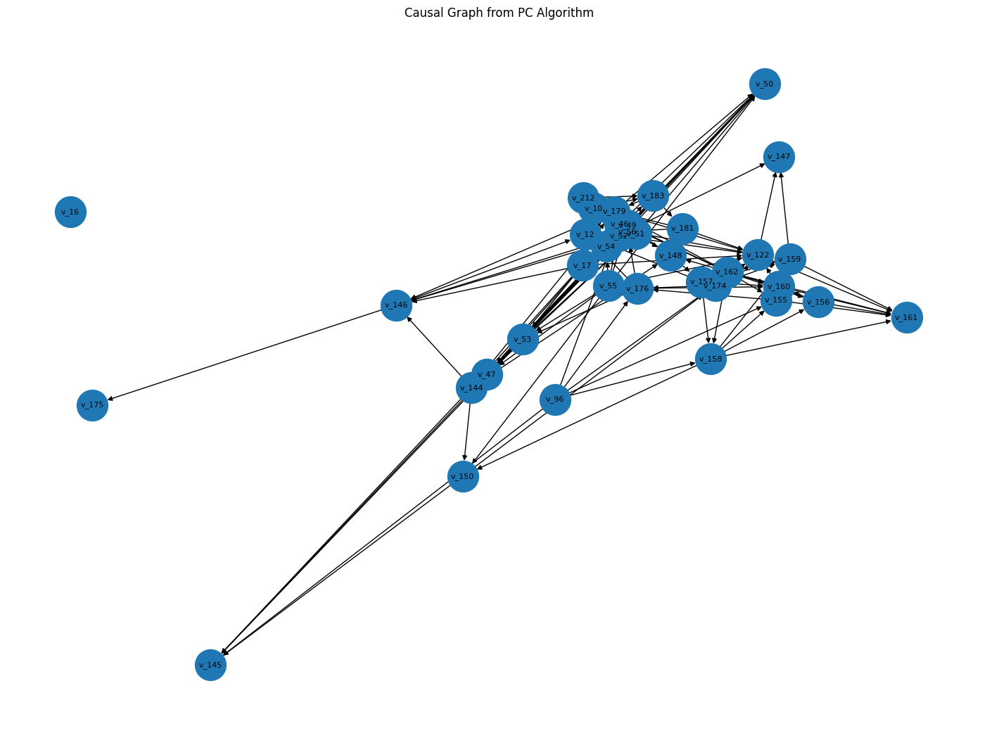

In [53]:
from causallearn.utils.cit import fisherz

# Convert to numpy for causal-learn
data_np = scaled_df.to_numpy()

# Apply PC algorithm
cg = pc(data_np, alpha=0.05, ci_test=fisherz)

# Get the adjacency matrix from the CG object
adj_matrix = cg.G.graph

# Create a directed graph
G = nx.DiGraph()

# Add nodes (your column names)
labels = list(scaled_df.columns)
G.add_nodes_from(labels)

# Add edges based on the adjacency matrix
for i in range(len(labels)):
    for j in range(len(labels)):
        if adj_matrix[i][j] == 1:
            G.add_edge(labels[i], labels[j])

# Draw the graph
plt.figure(figsize=(14, 10))
pos = nx.spring_layout(G, seed=42)  # for consistent layout
nx.draw(G, pos, with_labels=True, node_size=1000, font_size=8, arrows=True)
plt.title("Causal Graph from PC Algorithm")
plt.show()

In [ ]:
pip show networkx

Name: networkxNote: you may need to restart the kernel to use updated packages.

Version: 3.4.2
Summary: Python package for creating and manipulating graphs and networks
Home-page: https://networkx.org/
Author: 
Author-email: Aric Hagberg <hagberg@lanl.gov>
License: 
Location: c:\Users\LENOVO\AppData\Local\Programs\Python\Python311\Lib\site-packages
Requires: 
Required-by: causal-learn, cdt, dowhy, lingam, pgmpy, torch


In [54]:
from lingam import DirectLiNGAM

# Load your data
df = scaled_df  # replace with your file
model = DirectLiNGAM()
model.fit(df)

# Print the adjacency matrix
print("Adjacency Matrix:\n", model.adjacency_matrix_)

# Optional: Get the causal ordering of variables
print("Causal ordering:", model.causal_order_)


Adjacency Matrix:
 [[0.         0.         0.10120377 ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.25032017 0.         ... 0.         0.         0.        ]
 ...
 [0.         0.         0.         ... 0.         0.22757407 0.11297274]
 [0.         0.06895305 0.         ... 0.         0.         0.10914114]
 [0.04003874 0.         0.         ... 0.         0.         0.        ]]
Causal ordering: [7, 16, 17, 11, 8, 15, 9, 14, 18, 5, 6, 1, 23, 25, 4, 12, 2, 26, 30, 0, 31, 36, 24, 32, 29, 28, 27, 13, 3, 35, 34, 33, 19, 10, 20, 21, 22]


In [56]:
columns = df.columns.tolist()

# Example: Print out the causal ordering with variable names
print("Causal Ordering (with variable names):")
for i in model.causal_order_:
    print(f"{i}: {columns[i]}")

Causal Ordering (with variable names):
7: v_174
16: v_160
17: v_161
11: v_155
8: v_175
15: v_159
9: v_176
14: v_158
18: v_162
5: v_148
6: v_150
1: v_144
23: v_46
25: v_49
4: v_147
12: v_156
2: v_145
26: v_50
30: v_54
0: v_96
31: v_55
36: v_122
24: v_47
32: v_56
29: v_53
28: v_52
27: v_51
13: v_157
3: v_146
35: v_179
34: v_181
33: v_183
19: v_10
10: v_212
20: v_12
21: v_16
22: v_17


In [57]:
adj_matrix = pd.DataFrame(model.adjacency_matrix_, index=columns, columns=columns)

# Print the whole thing (no truncation)
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.width', None)
print(adj_matrix)

           v_96     v_144     v_145     v_146     v_147     v_148     v_150  \
v_96   0.000000  0.000000  0.101204  0.000000  0.000000  0.000000  0.000000   
v_144  0.000000  0.000000  0.000000  0.000000  0.000000  0.248830  0.199953   
v_145  0.000000  0.250320  0.000000  0.000000  0.270592  0.000000  0.188306   
v_146  0.000000  0.108194  0.156092  0.000000  0.200857  0.000000  0.000000   
v_147  0.000000  0.348091  0.000000  0.000000  0.000000  0.058560  0.087290   
v_148  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
v_150  0.000000  0.000000  0.000000  0.000000  0.000000  0.689792  0.000000   
v_174  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
v_175  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
v_176  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
v_212  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
v_155  0.000000  0.000000  0.000000  0.000000  0.000

In [58]:
adj_matrix.to_csv("lingam_adjacency_matrix.csv")


In [74]:
edges = []

for i in range(len(columns)):
    for j in range(len(columns)):
        weight = adj_matrix.iloc[i, j]
        if weight != 0:
            edges.append((columns[i], columns[j], weight))

print("Discovered causal edges:")
for edge in edges:
    print(f"{edge[0]} → {edge[1]} (weight: {edge[2]:.3f})")

# Sort edges by weight (index 2), descending
edges_sorted = sorted(edges, key=lambda x: x[2], reverse=True)

# Save to .txt file with UTF-8 encoding to avoid Unicode issues
with open("causal_edges_sorted.txt", "w", encoding="utf-8") as f:
    f.write("Discovered Causal Edges (Sorted by Weight):\n\n")
    for edge in edges_sorted:
        f.write(f"{edge[0]} → {edge[1]} (weight: {edge[2]:.3f})\n")

print("✅ Sorted edges saved to 'causal_edges_sorted.txt'")

Discovered causal edges:
v_176 → v_174 (weight: 0.801)
v_159 → v_174 (weight: 0.254)
v_12 → v_176 (weight: -0.013)
v_148 → v_176 (weight: 0.162)
v_148 → v_159 (weight: 0.224)
v_148 → v_174 (weight: 0.248)
v_122 → v_159 (weight: 0.105)
v_122 → v_148 (weight: 0.149)
v_122 → v_150 (weight: 0.100)
v_122 → v_96 (weight: 0.073)
v_122 → v_174 (weight: 0.395)
v_150 → v_148 (weight: 0.713)
v_150 → v_174 (weight: 0.182)
v_96 → v_176 (weight: 0.228)
v_96 → v_159 (weight: 0.157)
v_96 → v_148 (weight: 0.137)
✅ Sorted edges saved to 'causal_edges_sorted.txt'


In [ ]:
edges = []

for i in range(len(columns)):
    for j in range(len(columns)):
        weight = adj_matrix.iloc[i, j]
        if weight != 0:
            edges.append((columns[i], columns[j], weight))

print("Discovered causal edges:")
for edge in edges:
    print(f"{edge[0]} → {edge[1]} (weight: {edge[2]:.3f})")

Discovered causal edges:
v_176 → v_174 (weight: 0.801)
v_159 → v_174 (weight: 0.254)
v_12 → v_176 (weight: -0.013)
v_148 → v_176 (weight: 0.162)
v_148 → v_159 (weight: 0.224)
v_148 → v_174 (weight: 0.248)
v_122 → v_159 (weight: 0.105)
v_122 → v_148 (weight: 0.149)
v_122 → v_150 (weight: 0.100)
v_122 → v_96 (weight: 0.073)
v_122 → v_174 (weight: 0.395)
v_150 → v_148 (weight: 0.713)
v_150 → v_174 (weight: 0.182)
v_96 → v_176 (weight: 0.228)
v_96 → v_159 (weight: 0.157)
v_96 → v_148 (weight: 0.137)


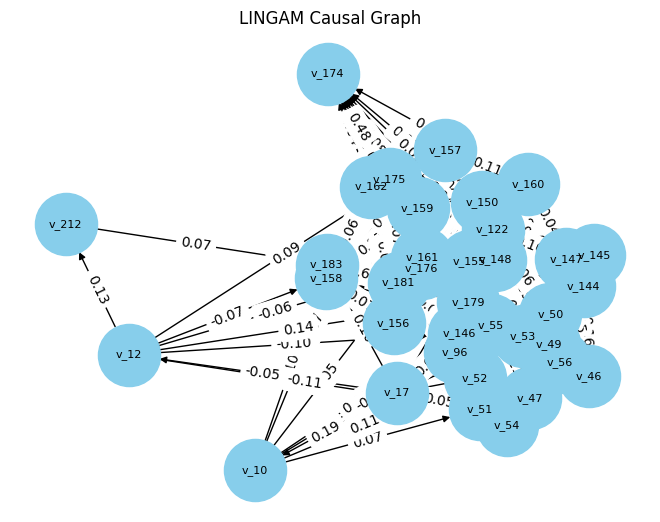

In [60]:
G = nx.DiGraph()

for src, tgt, weight in edges:
    G.add_edge(src, tgt, weight=weight)

pos = nx.spring_layout(G)
nx.draw(G, pos, with_labels=True, node_color='skyblue', node_size=2000, font_size=8, arrows=True)
nx.draw_networkx_edge_labels(G, pos, edge_labels={(u, v): f"{d['weight']:.2f}" for u, v, d in G.edges(data=True)})
plt.title("LINGAM Causal Graph")
plt.show()

C:\Users\LENOVO\AppData\Local\Temp\ipykernel_5136\1132277596.py:74: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


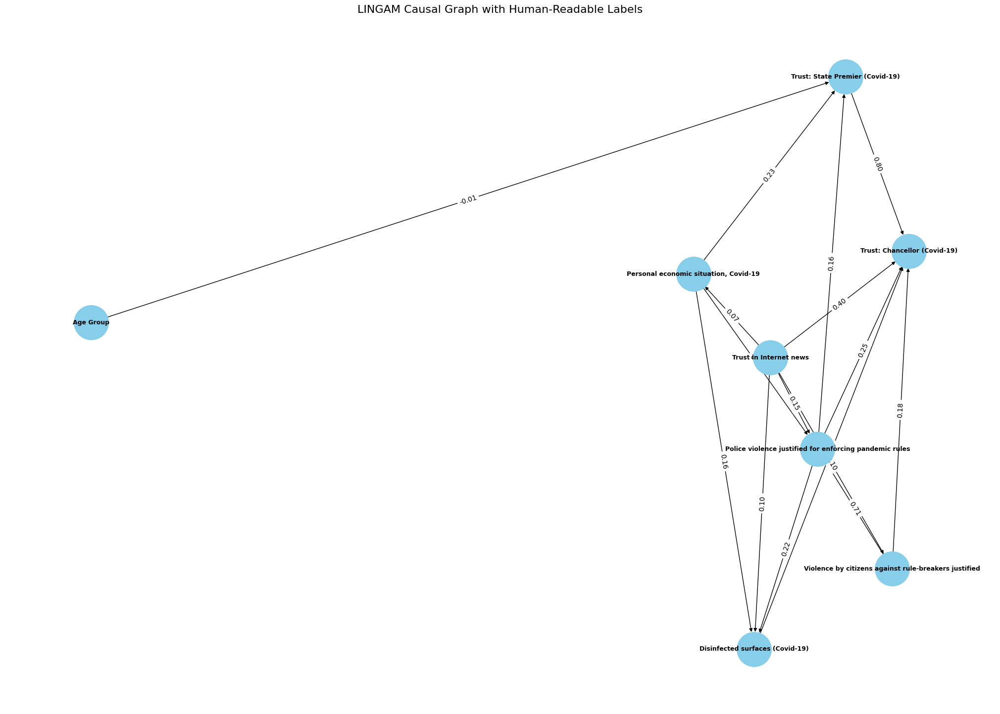

In [61]:
# LINGAM + Visualization with Readable Labels

# Fit LINGAM model
model = DirectLiNGAM()
model.fit(new_w1_selected)

# Create adjacency matrix with original column names
adj_matrix = pd.DataFrame(model.adjacency_matrix_, 
                          index=new_w1_selected.columns, 
                          columns=new_w1_selected.columns)

# Human-readable variable labels
column_labels = {
    "v_10": "Gender",
    "v_12": "Age Group",
    "v_16": "Federal State",
    "v_17": "Interest in Politics",
    "v_96": "Personal economic situation, Covid-19",
    "v_144": "Freedom of speech during pandemic",
    "v_145": "Public interest priority during pandemic",
    "v_146": "Government power shouldn't be limited by parliament",
    "v_147": "Experts, not politicians, should make pandemic decisions",
    "v_148": "Police violence justified for enforcing pandemic rules",
    "v_150": "Violence by citizens against rule-breakers justified",
    "v_155": "Avoided crowded places (Covid-19)",
    "v_156": "Kept distance (Covid-19)",
    "v_157": "Worked from home (Covid-19)",
    "v_158": "Washed hands more often (Covid-19)",
    "v_159": "Disinfected surfaces (Covid-19)",
    "v_160": "Stocked up on supplies (Covid-19)",
    "v_161": "Reduced personal contacts (Covid-19)",
    "v_162": "Wore mask even when not required (Covid-19)",
    "v_174": "Trust: Chancellor (Covid-19)",
    "v_175": "Trust: Federal Minister of Health (Covid-19)",
    "v_176": "Trust: State Premier (Covid-19)",
    "v_212": "World will be better, worse, or same after Covid-19",
    "v_46": "Immigrants should adapt to German culture",
    "v_47": "Quota for women in company boards",
    "v_49": "Gov't should reduce income differences",
    "v_50": "Financial aid to EU states in crisis",
    "v_51": "Federal referenda should be possible",
    "v_52": "Energy supply should include nuclear power",
    "v_53": "Push forward European unification",
    "v_54": "Upper limit on refugees in Germany",
    "v_55": "Same-sex marriage should be allowed",
    "v_56": "Media is one-sided on political issues",
    "v_179": "Social media can be used to influence politics",
    "v_181": "False information influenced elections in Germany",
    "v_183": "False info used to influence 2021 federal election",
    "v_122": "Trust in Internet news"
}

# Rename matrix
adj_matrix_renamed = adj_matrix.rename(index=column_labels, columns=column_labels)

# Extract causal edges
edges = []
for i in range(len(adj_matrix_renamed)):
    for j in range(len(adj_matrix_renamed.columns)):
        weight = adj_matrix_renamed.iloc[i, j]
        if weight != 0:
            edges.append((adj_matrix_renamed.index[i], adj_matrix_renamed.columns[j], weight))

# Build graph and visualize
G = nx.DiGraph()
for src, tgt, weight in edges:
    G.add_edge(src, tgt, weight=weight)

plt.figure(figsize=(20, 14))
pos = nx.spring_layout(G, seed=42)
nx.draw(G, pos, with_labels=True, node_color='skyblue', node_size=2500, font_size=9, font_weight='bold', arrows=True)
nx.draw_networkx_edge_labels(G, pos, edge_labels={(u, v): f"{d['weight']:.2f}" for u, v, d in G.edges(data=True)})
plt.title("LINGAM Causal Graph with Human-Readable Labels", fontsize=16)
plt.tight_layout()
plt.show()

  0%|          | 0/8 [00:00<?, ?it/s]

C:\Users\LENOVO\AppData\Local\Temp\ipykernel_5136\1919210884.py:51: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


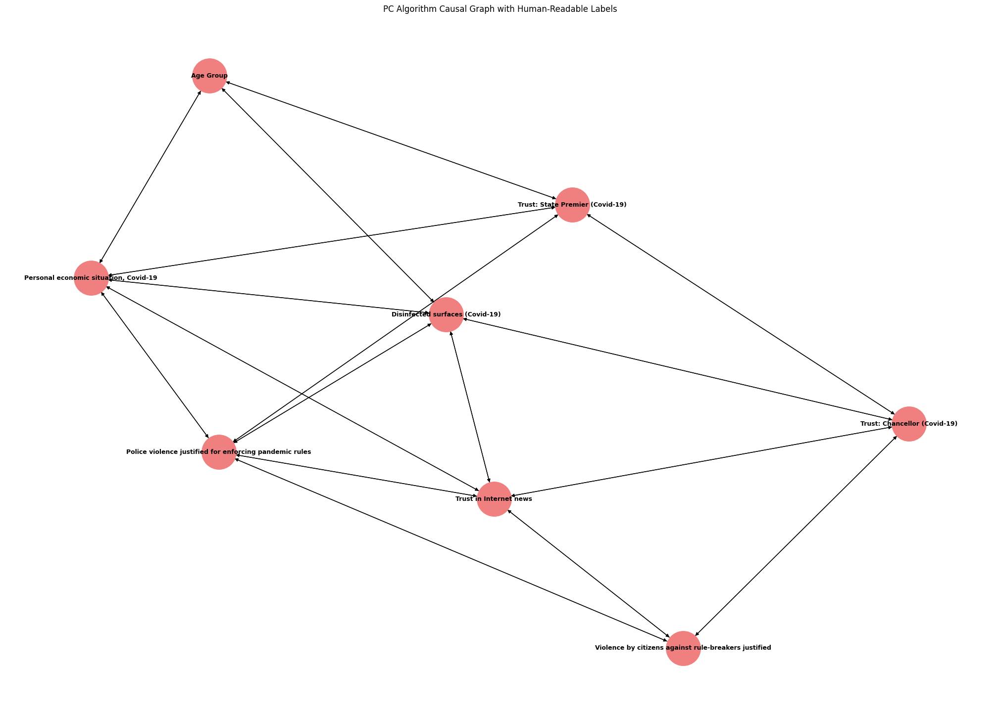

In [63]:
#PC algorithm with labeled columns

# Use your existing selected dataframe
X = new_w1_selected.values
columns = new_w1_selected.columns.tolist()

# Run PC algorithm
cg = pc(X)

# Map numeric indices back to original variable names
mapping = {i: columns[i] for i in range(len(columns))}
graph = nx.DiGraph()

# Build the graph using learned edges
for i in range(len(cg.G.graph)):
    for j in range(len(cg.G.graph)):
        if cg.G.graph[i][j] != 0:
            graph.add_edge(mapping[i], mapping[j])

# Human-readable labels
column_labels = {
    "v_10": "Gender", "v_12": "Age Group", "v_16": "Federal State", "v_17": "Interest in Politics",
    "v_96": "Personal economic situation, Covid-19", "v_144": "Freedom of speech during pandemic",
    "v_145": "Public interest priority during pandemic", "v_146": "Government power shouldn't be limited by parliament",
    "v_147": "Experts, not politicians, should make pandemic decisions",
    "v_148": "Police violence justified for enforcing pandemic rules",
    "v_150": "Violence by citizens against rule-breakers justified", "v_155": "Avoided crowded places (Covid-19)",
    "v_156": "Kept distance (Covid-19)", "v_157": "Worked from home (Covid-19)",
    "v_158": "Washed hands more often (Covid-19)", "v_159": "Disinfected surfaces (Covid-19)",
    "v_160": "Stocked up on supplies (Covid-19)", "v_161": "Reduced personal contacts (Covid-19)",
    "v_162": "Wore mask even when not required (Covid-19)", "v_174": "Trust: Chancellor (Covid-19)",
    "v_175": "Trust: Federal Minister of Health (Covid-19)", "v_176": "Trust: State Premier (Covid-19)",
    "v_212": "World will be better, worse, or same after Covid-19", "v_46": "Immigrants should adapt to German culture",
    "v_47": "Quota for women in company boards", "v_49": "Gov't should reduce income differences",
    "v_50": "Financial aid to EU states in crisis", "v_51": "Federal referenda should be possible",
    "v_52": "Energy supply should include nuclear power", "v_53": "Push forward European unification",
    "v_54": "Upper limit on refugees in Germany", "v_55": "Same-sex marriage should be allowed",
    "v_56": "Media is one-sided on political issues", "v_179": "Social media can be used to influence politics",
    "v_181": "False information influenced elections in Germany", "v_183": "False info used to influence 2021 federal election",
    "v_122": "Trust in Internet news"
}

# Relabel nodes for better readability
graph = nx.relabel_nodes(graph, column_labels)

# Plot the graph
plt.figure(figsize=(20, 14))
pos = nx.spring_layout(graph, seed=42)
nx.draw(graph, pos, with_labels=True, node_color="lightcoral", node_size=2500, font_size=9, font_weight='bold')
plt.title("PC Algorithm Causal Graph with Human-Readable Labels")
plt.tight_layout()
plt.show()

In [64]:
pip show dowhy

Name: dowhyNote: you may need to restart the kernel to use updated packages.

Version: 0.12
Summary: DoWhy is a Python library for causal inference that supports explicit modeling and testing of causal assumptions
Home-page: https://github.com/py-why/dowhy
Author: PyWhy Community
Author-email: amshar@microsoft.com
License: MIT
Location: c:\Users\LENOVO\AppData\Local\Programs\Python\Python311\Lib\site-packages
Requires: causal-learn, cvxpy, cython, joblib, networkx, numba, numpy, pandas, scikit-learn, scipy, statsmodels, sympy, tqdm
Required-by: 


In [68]:
from sklearn.linear_model import LinearRegression
from collections import defaultdict


In [70]:
# Reverse the label mapping: from human-readable to variable names
reverse_mapping = {v: k for k, v in column_labels.items()}

# Relabel the DAG so nodes match the column names in your data
G = nx.relabel_nodes(G, reverse_mapping)

In [71]:
real_data = df[selected_columns].sample(n=1000, random_state=42)
topo_order = list(nx.topological_sort(G))

models = {}
noises = defaultdict(list)

# Learn SCM (f_i functions + noise)
for node in topo_order:
    parents = list(G.predecessors(node))
    if parents:
        X = real_data[parents].values
        y = real_data[node].values
        model = LinearRegression().fit(X, y)
        y_pred = model.predict(X)
        noise = y - y_pred
        models[node] = model
        noises[node] = noise
    else:
        noises[node] = real_data[node].values  # marginal distribution

# Generate synthetic data
n_samples = 300
synthetic_data = pd.DataFrame(index=range(n_samples), columns=topo_order)

for i in range(n_samples):
    row = {}
    for node in topo_order:
        parents = list(G.predecessors(node))
        if parents:
            X_parent = np.array([row[p] for p in parents]).reshape(1, -1)
            pred = models[node].predict(X_parent)[0]
            noise_sample = np.random.choice(noises[node])
            row[node] = pred + noise_sample
        else:
            row[node] = np.random.choice(noises[node])
    synthetic_data.loc[i] = row

Estimating Causal Effect between Trust in Internet News and Trust in Chancellor (Real Data)

In [ ]:
from dowhy import CausalModel

treatment = "v_122"
outcome = "v_174"
common_causes = list(set(real_data.columns) - {treatment, outcome})

model = CausalModel(
    data=real_data,
    treatment=treatment,
    outcome=outcome,
    common_causes=common_causes
)

identified_estimand = model.identify_effect()
estimate = model.estimate_effect(identified_estimand, method_name="backdoor.linear_regression")
print("Estimated Causal Effect:", estimate.value)

c:\Users\LENOVO\AppData\Local\Programs\Python\Python311\Lib\site-packages\dowhy\graph.py:99: DeprecationWarning: d_separated is deprecated and will be removed in NetworkX v3.5.Please use `is_d_separator(G, x, y, z)`.
  dseparated = nx.algorithms.d_separated(new_graph, set(nodes1), set(nodes2), set(nodes3))


Estimated Causal Effect: 0.0032078250194453976


c:\Users\LENOVO\AppData\Local\Programs\Python\Python311\Lib\site-packages\dowhy\causal_estimators\regression_estimator.py:131: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  intercept_parameter = self.model.params[0]


In [92]:
# Fix column types
synthetic_data = synthetic_data.apply(pd.to_numeric, errors='coerce')  # convert everything to numeric
synthetic_data = synthetic_data.fillna(0)  # or use another imputation strategy
synthetic_data = synthetic_data.astype(float)  # ensure float type

Estimating Causal Effect between Trust in Internet News and Trust in Chancellor (Synthetic Data)

In [93]:
from dowhy import CausalModel

# Define treatment and outcome
treatment = "v_122"
outcome = "v_174"

# Define common causes (all other variables except treatment & outcome)
common_causes = list(set(synthetic_data.columns) - {treatment, outcome})

# Create CausalModel for synthetic data
model_synth = CausalModel(
    data=synthetic_data,
    treatment=treatment,
    outcome=outcome,
    common_causes=common_causes
)

# Identify causal effect and estimate it
identified_estimand_synth = model_synth.identify_effect()
estimate_synth = model_synth.estimate_effect(identified_estimand_synth, method_name="backdoor.linear_regression")

# Print the result
print("Estimated Causal Effect (Synthetic Data):", estimate_synth.value)

Estimated Causal Effect (Synthetic Data): 0.025749241800537635


c:\Users\LENOVO\AppData\Local\Programs\Python\Python311\Lib\site-packages\dowhy\graph.py:99: DeprecationWarning: d_separated is deprecated and will be removed in NetworkX v3.5.Please use `is_d_separator(G, x, y, z)`.
  dseparated = nx.algorithms.d_separated(new_graph, set(nodes1), set(nodes2), set(nodes3))
c:\Users\LENOVO\AppData\Local\Programs\Python\Python311\Lib\site-packages\dowhy\causal_estimators\regression_estimator.py:131: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  intercept_parameter = self.model.params[0]


For real data, result: 0.0032078250194453976
For synthetic data, result: 0.025749241800537635

Estimating Causal Effect between Personal Economic Situation and Trust in State Premier (Real Data)

In [95]:
treatment = "v_96"
outcome = "v_176"
common_causes = list(set(real_data.columns) - {treatment, outcome})

model = CausalModel(
    data=real_data,
    treatment=treatment,
    outcome=outcome,
    common_causes=common_causes
)

identified_estimand = model.identify_effect()
estimate = model.estimate_effect(identified_estimand, method_name="backdoor.linear_regression")
print("Estimated Causal Effect:", estimate.value)

c:\Users\LENOVO\AppData\Local\Programs\Python\Python311\Lib\site-packages\dowhy\graph.py:99: DeprecationWarning: d_separated is deprecated and will be removed in NetworkX v3.5.Please use `is_d_separator(G, x, y, z)`.
  dseparated = nx.algorithms.d_separated(new_graph, set(nodes1), set(nodes2), set(nodes3))


Estimated Causal Effect: 0.023988276357102094


c:\Users\LENOVO\AppData\Local\Programs\Python\Python311\Lib\site-packages\dowhy\causal_estimators\regression_estimator.py:131: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  intercept_parameter = self.model.params[0]


Estimating Causal Effect between Personal Economic Situation and Trust in State Premier (Synthetic Data)

In [96]:
# Define treatment and outcome
treatment = "v_96"
outcome = "v_176"

# Define common causes (all other variables except treatment & outcome)
common_causes = list(set(synthetic_data.columns) - {treatment, outcome})

# Create CausalModel for synthetic data
model_synth = CausalModel(
    data=synthetic_data,
    treatment=treatment,
    outcome=outcome,
    common_causes=common_causes
)

# Identify causal effect and estimate it
identified_estimand_synth = model_synth.identify_effect()
estimate_synth = model_synth.estimate_effect(identified_estimand_synth, method_name="backdoor.linear_regression")

# Print the result
print("Estimated Causal Effect (Synthetic Data):", estimate_synth.value)

Estimated Causal Effect (Synthetic Data): 0.14030970450892322


c:\Users\LENOVO\AppData\Local\Programs\Python\Python311\Lib\site-packages\dowhy\graph.py:99: DeprecationWarning: d_separated is deprecated and will be removed in NetworkX v3.5.Please use `is_d_separator(G, x, y, z)`.
  dseparated = nx.algorithms.d_separated(new_graph, set(nodes1), set(nodes2), set(nodes3))
c:\Users\LENOVO\AppData\Local\Programs\Python\Python311\Lib\site-packages\dowhy\causal_estimators\regression_estimator.py:131: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  intercept_parameter = self.model.params[0]


For real data, result: 0.023988276357102094
For synthetic data, result: 0.14030970450892322